In [ ]:
subset_df = df[df['popularity'] > 50]

In [ ]:
subset_df = subset_df.drop(columns=['Unnamed: 0','track_id', 'artists', 'album_name', 'track_name'])
print(subset_df.head())


   popularity  duration_ms  explicit  danceability  energy  key  loudness  \
0          73       230666     False         0.676  0.4610    1    -6.746   
1          55       149610     False         0.420  0.1660    1   -17.235   
2          57       210826     False         0.438  0.3590    0    -9.734   
3          71       201933     False         0.266  0.0596    0   -18.515   
4          82       198853     False         0.618  0.4430    2    -9.681   

   mode  speechiness  acousticness  instrumentalness  liveness  valence  \
0     0       0.1430        0.0322          0.000001    0.3580    0.715   
1     1       0.0763        0.9240          0.000006    0.1010    0.267   
2     1       0.0557        0.2100          0.000000    0.1170    0.120   
3     1       0.0363        0.9050          0.000071    0.1320    0.143   
4     1       0.0526        0.4690          0.000000    0.0829    0.167   

     tempo  time_signature track_genre  
0   87.917               4    acoustic  
1   

In [ ]:
print(subset_df.columns)
print(subset_df.describe())

Index(['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre'],
      dtype='object')
         popularity   duration_ms  danceability        energy           key  \
count  27770.000000  2.777000e+04  27770.000000  27770.000000  27770.000000   
mean      62.117105  2.202841e+05      0.582715      0.631511      5.300144   
std        8.567154  7.417391e+04      0.161797      0.240079      3.560243   
min       51.000000  3.062200e+04      0.000000      0.000020      0.000000   
25%       55.000000  1.757210e+05      0.479000      0.474000      2.000000   
50%       60.000000  2.105710e+05      0.592000      0.668000      5.000000   
75%       67.000000  2.512660e+05      0.702000      0.828000      8.000000   
max      100.000000  3.340672e+06      0.980000      0.999000     11.000000   

           loudness        

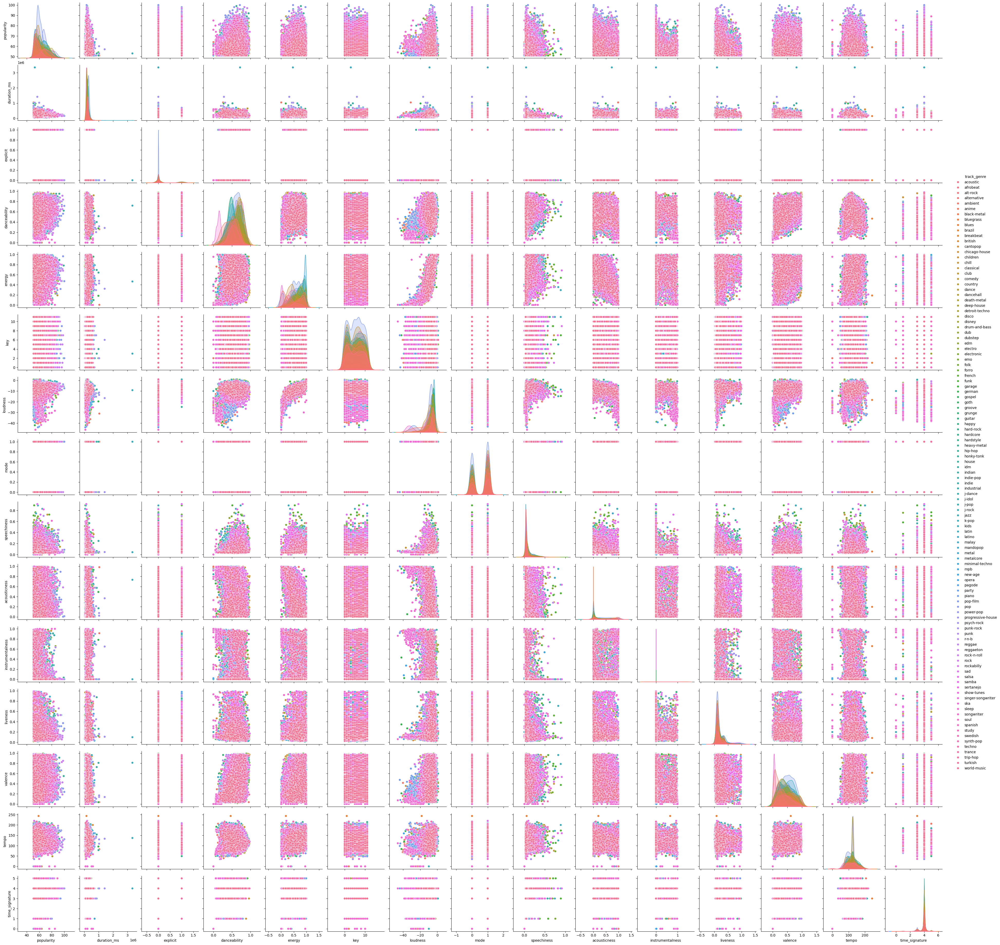

In [ ]:
sns.pairplot(subset_df, hue='track_genre')

In [ ]:
encoding_df = pd.get_dummies(subset_df, columns=['track_genre'], prefix=['genre'])


In [ ]:
encoding_df
pd.set_option('display.max_columns', None)
print(encoding_df.columns)

Index(['popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       ...
       'genre_soul', 'genre_spanish', 'genre_study', 'genre_swedish',
       'genre_synth-pop', 'genre_techno', 'genre_trance', 'genre_trip-hop',
       'genre_turkish', 'genre_world-music'],
      dtype='object', length=125)


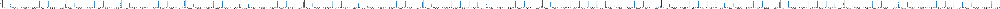

In [ ]:
sns.pairplot(encoding_df, x_vars=encoding_df.columns[16:], y_vars=['popularity'], kind='scatter')
plt.show()

### Scaling - normalizing

In [ ]:
scaler = StandardScaler()
feature_cols = ['duration_ms', 'danceability', 'energy', 'tempo', 'loudness', 'speechiness',
                'acousticness', 'instrumentalness', 'liveness', 'valence']
encoding_df[feature_cols] = scaler.fit_transform(encoding_df[feature_cols])

### Pairplots

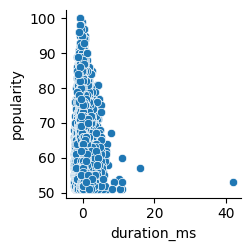

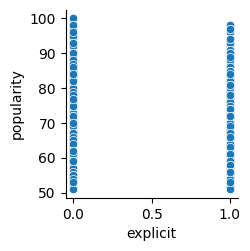

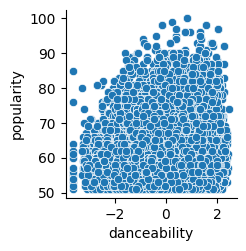

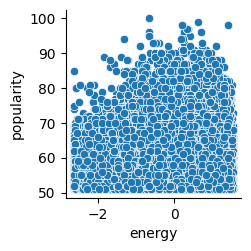

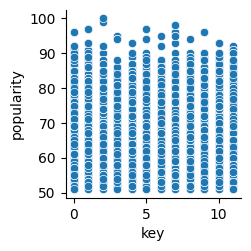

...

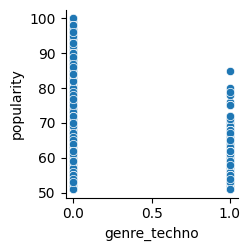

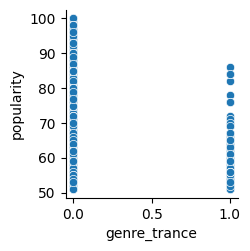

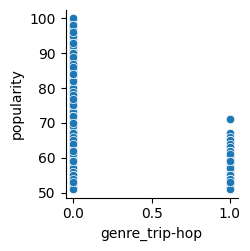

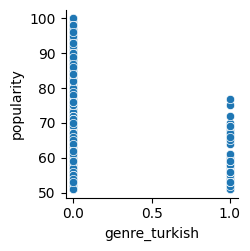

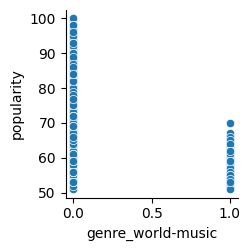

In [ ]:
for col in encoding_df.columns:
    if col != 'popularity':
        sns.pairplot(encoding_df, x_vars=[col], y_vars=['popularity'], kind='scatter')
        plt.show()

In [ ]:
df_numeric = encoding_df.select_dtypes(include=[float, int])

In [ ]:
print(df_numeric.head(20))

    popularity  duration_ms  danceability    energy  key  loudness  mode  \
0           73     0.139969      0.576567 -0.710243    1  0.236356     0   
1           55    -0.952834     -1.005688 -1.939028    1 -1.814047     1   
2           57    -0.127515     -0.894436 -1.135111    0 -0.347742     1   
3           71    -0.247411     -1.957514 -2.382224    0 -2.064263     1   
4           82    -0.288936      0.218088 -0.785220    2 -0.337381     1   
5           58    -0.081487      0.650736 -0.626935    6 -0.166531     1   
6           74     0.122901     -1.086037 -2.018170    2 -0.169463     1   
7           80     0.305529      0.743446 -0.781054   11 -0.268963     1   
8           74    -0.413510      0.261352 -0.906015    0 -0.145614     1   
9           56    -0.198053     -0.869713  0.002036    1  0.231665     1   
10          74     0.330525      0.273714 -1.118450    8 -0.033603     1   
11          69     0.268035     -0.616305 -1.368372    4 -0.411078     1   
12          

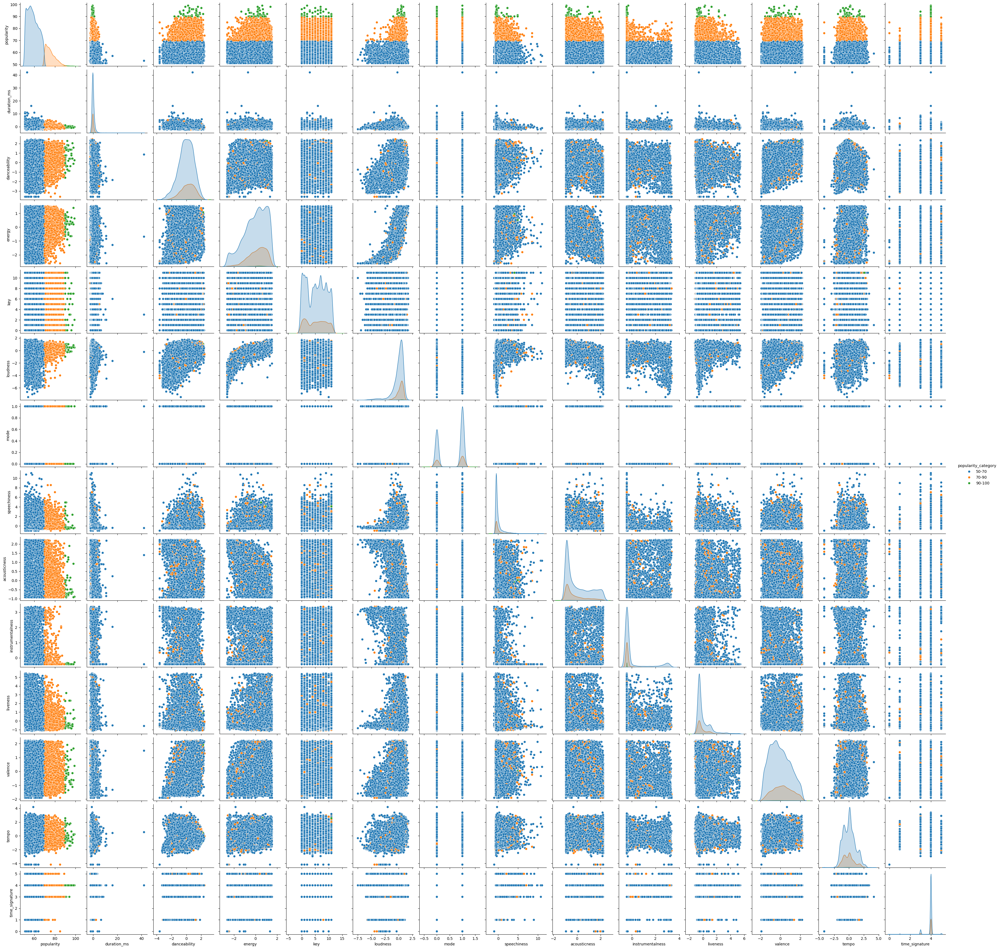

In [ ]:
# Define thresholds for popularity
thresholds = [50, 70, 90, 100]

# Create a new column 'popularity_category' based on the thresholds
df_numeric['popularity_category'] = pd.cut(df_numeric['popularity'], bins=thresholds, labels=['50-70', '70-90', '90-100'], right=False)

# Plot the scatterplot with popularity as hue
sns.pairplot(data=df_numeric, hue='popularity_category')
plt.show()